
# InceptionV3 & NasNet

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE
import pathlib
import shutil
import tempfile
from PIL import Image
from itertools import cycle
import os
from  IPython import display
from scipy.interpolate import interp1d
from scipy.ndimage.interpolation import rotate, shift
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.metrics import categorical_accuracy
from tensorflow.keras import regularizers, optimizers

np.random.seed(123)
tf.random.set_seed(123)

In [ ]:
#Static Configurations
IMAGE_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/Images/'
DATA_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/'

In [ ]:
# Load Data
train_data = pd.read_csv(DATA_DIR + 'S40AR_train_data.csv')
test_data = pd.read_csv(DATA_DIR + 'S40AR_test_data.csv')

In [ ]:
def plot_from_generator(generator):
  plt.figure(figsize = (20,8))
  i = 0
  for x,[y,z] in generator.__iter__():
    plt.subplot(2,4,i+1)
    plt.imshow(x[0,:,:,0])
    plt.label(str(y[i])+ '_' + str(z[i]))
    plt.colorbar()
    plt.grid(False)
    i += 1
    if i == 7:
      break
  plt.tight_layout(rect = [0, 0.03, 1, 0.95])
  return plt.show()

#Helper function borrowed from Ruwan to see the performance of all models
def plotter(history_hold, alias = 'action', metric = 'loss', ylim=[0.0, 1.0], figsize=(8,8)):
  plt.figure(figsize=figsize)
  cycol = cycle('bgrcmk')
  for name, item in history_hold.items():
    y_train = item.history[alias +'_' + metric]
    y_val = item.history['val_' + alias +'_' + metric]
    x_train = np.arange(0,len(y_val))

    c=next(cycol)

    plt.plot(x_train, y_train, c+'-', label=name+'_train')
    plt.plot(x_train, y_val, c+'--', label=name+'_val')

  plt.legend()
  plt.xlim([1, max(plt.xlim())])
  plt.ylim(ylim)
  plt.xlabel('Epoch')
  plt.ylabel(metric)
  plt.grid(True)

def plot_learning_curve(train_loss, val_loss, train_metric, val_metric, title, metric_name='Accuracy'):
    plt.figure(figsize=(15,8))
    
    plt.subplot(1,2,1)
    plt.plot(train_loss, 'r--')
    plt.plot(val_loss, 'b--')
    plt.xlabel("epochs")
    plt.ylabel("Loss")
    plt.legend(['train', 'val'], loc='upper left')

    plt.subplot(1,2,2)
    plt.plot(train_metric, 'r--')
    plt.plot(val_metric, 'b--')
    plt.xlabel("epochs")
    plt.ylabel(metric_name)
    plt.legend(['train', 'val'], loc='upper left')
    plt.suptitle(title)
    plt.show()

def plot_both_curves(histories, model_name):
  # Action
  plot_learning_curve(histories[model_name].history['action_loss'],
                      histories[model_name].history['val_action_loss'],
                      histories[model_name].history['action_accuracy'],
                      histories[model_name].history['val_action_accuracy'],
                      "Action Model's Performance")
  # Action Class
  plot_learning_curve(histories[model_name].history['action_class_loss'],
                      histories[model_name].history['val_action_class_loss'],
                      histories[model_name].history['action_class_accuracy'],
                      histories[model_name].history['val_action_class_accuracy'],
                      'Learning Curves')

In [ ]:
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboard_logs"
shutil.rmtree(logdir, ignore_errors=True)

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Open an embedded TensorBoard viewer
%tensorboard --logdir {logdir}/models

<IPython.core.display.Javascript object>

## Encoding Targets

In [ ]:
#Encode labels

action_encoder = LabelEncoder()
action_cls_encoder = LabelEncoder()
train_data['action_label'] = action_encoder.fit_transform(train_data['action'])
train_data['action_class_label'] = action_cls_encoder.fit_transform(train_data['action_class'])

## Data Loader

In [ ]:
# Data Generator
class ImageDataLoader(tf.keras.utils.Sequence):
    def __init__(self,
                 df,
                 batch_size=32,
                 dim=(224,224, 3),
                 img_size = (224,224),
                 n_actions =21,
                 n_action_cls = 5,
                 data_mean=0,
                 data_std=1,
                 data_prefix='',
                 shuffle=True,
                 Augment=True):
        
        'Initialization'
        self.dim = dim  # Dimensions of the input
        self.batch_size = batch_size # Batch size
        self.img_size = img_size # Image size
        self.n_actions = n_actions  # Number of actions
        self.n_action_cls = n_action_cls  # Number of action class   
        self.shuffle = shuffle  # Flag to shuffle data at the end of epoch
        self.Augment = Augment  # Flag to augment the data

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.df = df
        self.action = df['action_label'].values.tolist()
        self.action_class = df['action_class_label'].values.tolist()
        self.image_ids = np.arange(len(self.df.index)).tolist()
        self.data_prefix = data_prefix
        
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        action_temp = [self.action[k] for k in indexes]
        action_class_temp = [self.action_class[k] for k in indexes]
        
        # Generate data
        X, first_target, second_target = self.__data_generation(data_ids_temp, action_temp, action_class_temp)
        
        return X,[first_target, second_target]

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.image_ids))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
            
    def __data_generation(self, data_ids_temp, action_temp, action_class_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        first_target = np.empty((self.batch_size), dtype=int)
        second_target = np.empty((self.batch_size), dtype = int)
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            first_target[i] = action_temp[i]
            second_target[i] = action_class_temp[i]
            
        return X, first_target, second_target


    def __read_data_instance(self, pid):
      # Read an image
      filepath = self.data_prefix + self.df.iloc[pid]['FileName']
      
      data = Image.open(filepath)
      data = data.resize(self.img_size) # Resize image
      data = np.asarray(data) # Convert into numpy array
      
      #Augmentation techniques
      if self.Augment:
        data = tf.image.resize_with_crop_or_pad(data, 240, 240)
        data = tf.image.random_crop(data, size = [224,224,3])
        data = tf.image.random_flip_left_right(data)
        data = tf.image.random_brightness(data, max_delta = 0.5)
        rot = np.random.rand(1) < 0.5
        if rot:
            rot = np.random.randint(-15,15, size=1)
            data = rotate(data, angle=rot[0], reshape=False)
          
        shift_val = np.random.randint(-5, high=5, size=2, dtype=int).tolist() + [0,]
        data = shift(data, shift_val, order=0, mode='constant', cval=0.0, prefilter=False)

      X = data
      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

# Data Preparation

In [ ]:
train_val, test = train_test_split(train_data,test_size = 0.15, random_state = 42, stratify = train_data[['action_label','action_class_label']])
train, valid = train_test_split(train_val, test_size = 0.15, random_state = 42, stratify = train_val[['action_label','action_class_label']])

# Modeling Configurations

In [ ]:
# Model Buidling Static Configurations
BATCH_SIZE = 64
IMG_DIM = (224, 224, 3)
IMG_SIZE = (224, 224)
NUM_EPOCHS = 100 #Num Epochs
CHECKPOINT_DIR = '/content/drive/MyDrive/deep_learning_assignment/A1_data/checkpoint/' #Checkpoint
N_TRAIN = train.shape[0] # Num of training examples
STEPS_PER_EPOCH = N_TRAIN//BATCH_SIZE # Steps for scheduler
LR = 0.01 # Learning rate
model_histories = {}

In [ ]:
# Training params
train_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':True,
    'data_prefix': IMAGE_DIR}

# No shuffle because we don't compute GD here!
val_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':False,
    'shuffle':False,
    'data_prefix': IMAGE_DIR}

# Training Generator with Augment Flag
aug_params = {'dim':IMG_DIM,
    'img_size':IMG_SIZE,
    'batch_size':BATCH_SIZE,
    'data_mean':0.,
    'data_std':255.0,
    'Augment':True,
    'shuffle':True,
    'data_prefix': IMAGE_DIR}

no_aug_train_generator = ImageDataLoader(train,**train_params) # Training generator no augment
aug_train_generator = ImageDataLoader(train,**aug_params) # Training generator augment
validation_generator = ImageDataLoader(valid,**val_params) # Validation generator

In [ ]:
# Inverse transformation to actual labels
target_action = action_encoder.inverse_transform(np.arange(21))
target_action_class = action_cls_encoder.inverse_transform(np.arange(5))

# Call back (Early Stopping, Tensorboard and Model Checkpoint)

def get_callbacks(name, ckpt_name):
  return [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30),
    tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(CHECKPOINT_DIR,ckpt_name),
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True),
    tf.keras.callbacks.TensorBoard(logdir/name)
  ]

def compile_and_fit(model, training_generator, validation_generator, name, ckpt_name, learning_rate = LR, max_epochs=NUM_EPOCHS):
  
  lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
    LR,
    decay_steps=STEPS_PER_EPOCH*100,
    decay_rate=1,
    staircase=False)
  # Optimizer
  optimizer = tf.keras.optimizers.Adam(lr_schedule)

  model.compile(optimizer=optimizer,
                loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

  model.summary()

  history = model.fit(
      training_generator,
      steps_per_epoch = STEPS_PER_EPOCH,
      batch_size = BATCH_SIZE,
      epochs=max_epochs,
      validation_data=validation_generator,
      callbacks=get_callbacks(name,ckpt_name),
      verbose=1)

  return history

def model_result(model, generator):
  
  action_preds = []
  action_trues = []
  action_cls_preds = []
  action_cls_trues = []
  N_images = len(generator.image_ids)
  
  batches = 0

  # iterate through the data generator and predict for each batch
  # hold the predictions and labels
  
  for x,[y,z] in generator.__iter__():
    action_pred, action_cls_pred = model.predict(x, verbose=0)
    
    action_pred = np.argmax(action_pred, axis = 1)
    action_cls_pred = np.argmax(action_cls_pred, axis = 1)
    # actions
    action_preds = action_preds + action_pred.tolist()
    action_trues = action_trues + y.tolist()
    
    # action class
    action_cls_preds = action_cls_preds + action_cls_pred.tolist()
    action_cls_trues = action_cls_trues + z.tolist()

    batches += 1
    if batches >= N_images / BATCH_SIZE:
        #break the loop
        break
  print("Action Macro F1-score: ", metrics.f1_score(action_trues, action_preds,average = "macro"))
  print("Action Class Macro F1-Score : ", metrics.f1_score(action_cls_trues,action_cls_preds,average= "macro"))
  print("Action Classification Report \n", metrics.classification_report(action_trues, action_preds, target_names = target_action))
  print("Action Class Classification Report \n", metrics.classification_report(action_cls_trues, action_cls_preds, target_names = target_action_class))

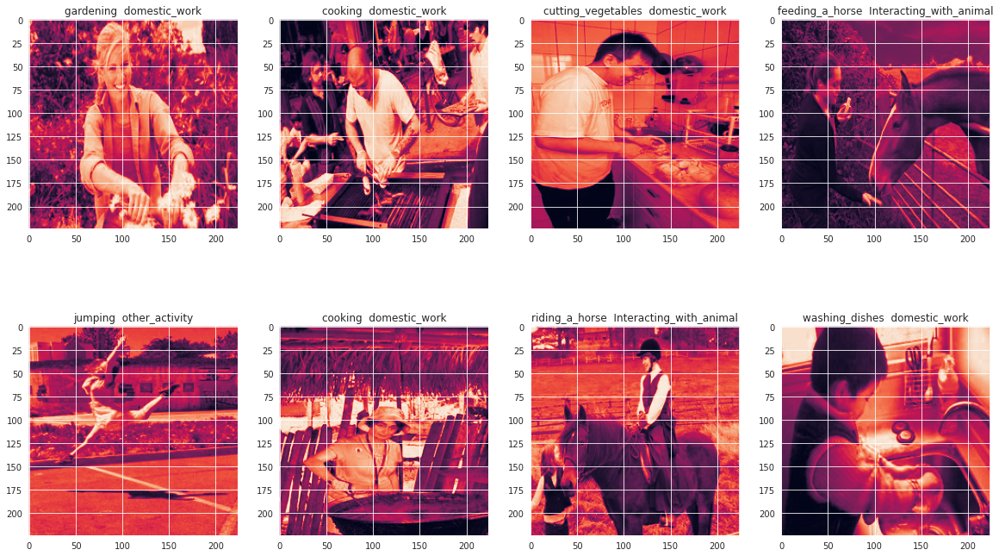

In [ ]:
# plt.figure(figsize = (20,12))
# i = 0
# for x,y in no_aug_training_generator.__iter__():
#   plt.subplot(2,4,i+1)
#   plt.imshow(x[i,:,:,0])
#   plt.title(str(clabels[y[0][i]]) +'  ' + str(actions[y[1][i]]))
#   i = i + 1
#   if i == 8:
#     break

## Multi-Output Model with Input Preprocessing

In [ ]:
class ActionModel():
  
  def __init__(self, input_shape, action_hidden_size_one,action_hidden_size_two, action_cls_hidden_size, action_dropout = 0.0, action_l2_prop = 0.0, action_cls_dropout = 0.0, action_cls_l2_prop = 0.0, training = False):
    self.input_shape = input_shape
    self.action_hidden_size_one = action_hidden_size_one
    self.action_hidden_size_two = action_hidden_size_two
    self.action_cls_hidden_size = action_cls_hidden_size
    self.action_dropout = action_dropout
    self.action_cls_dropout = action_cls_dropout
    self.action_l2_prop = action_l2_prop
    self.action_cls_l2_prop = action_cls_l2_prop
    self.training = training
  
  def build_action(self, inputs, preprocess_input, base_model):
    x = preprocess_input(inputs)
    x = base_model(x, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_hidden_size_one, kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_dropout)(x)
    x = Dense(self.action_hidden_size_two, kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_dropout)(x)
    x = Dense(21)(x)
    x = Activation('softmax', name = "action")(x)
    return x

  def build_action_class(self, inputs, preprocess_input, base_model):
    x = preprocess_input(inputs)
    x = base_model(x, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_cls_hidden_size,kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_cls_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_cls_dropout)(x)
    x = Dense(5)(x)
    x = Activation('softmax',name = "action_class")(x)
    return x

  def assemble_full_model(self, preprocess_input, base_model, name = "Model"):
    """
    assemble our multi-output model CNN.
    """
    input_layer = Input(shape=self.input_shape)
    action_model = self.build_action(input_layer, preprocess_input, base_model)
    action_class_model = self.build_action_class(input_layer, preprocess_input, base_model)
    model = Model(inputs = input_layer, outputs = [action_model, action_class_model],
                name=name)
    return model

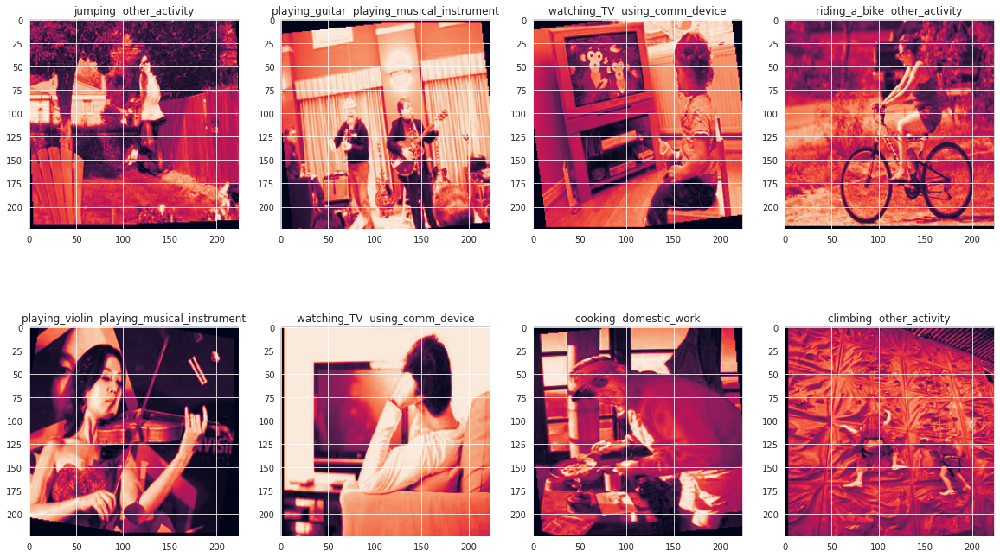

In [ ]:
# plt.figure(figsize = (20,12))
# i = 0
# for x,y in aug_training_generator.__iter__():
#   plt.subplot(2,4,i+1)
#   plt.imshow(x[i,:,:,0])
#   plt.title(str(clabels[y[0][i]]) +'  ' + str(actions[y[1][i]]))
#   i = i + 1
#   if i == 8:
#     break

## Transfer Learning

### InceptionV3

In [ ]:
inception = tf.keras.applications.InceptionV3(
    include_top=False,
    weights="imagenet",
    input_shape = IMG_DIM
)
inception.trainable = False

87924736/87910968 [==============================] - 1s 0us/step


In [ ]:
incep_preprocess = tf.keras.applications.inception_v3.preprocess_input

incep_model = ActionModel(input_shape=IMG_DIM,
                          action_hidden_size_one=1024,
                          action_hidden_size_two=256,
                          action_cls_hidden_size=512).assemble_full_model(incep_preprocess,inception,name = "InceptionV3")

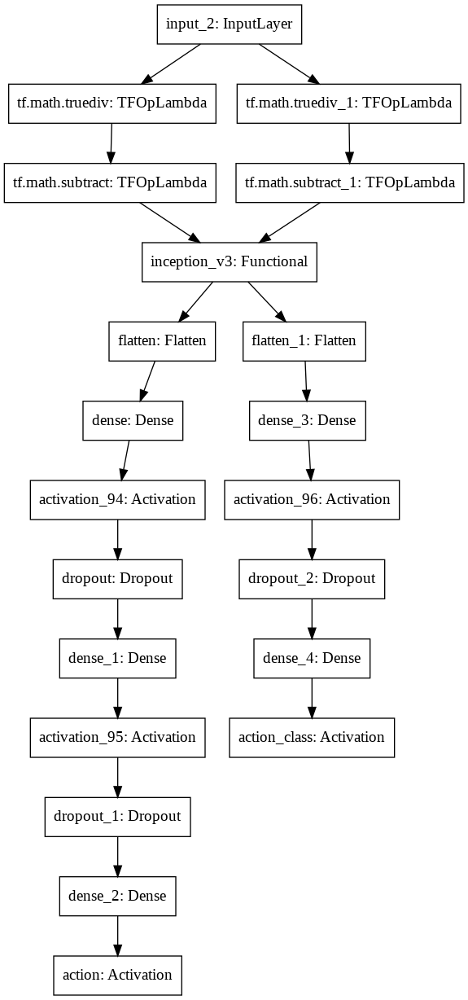

In [ ]:
tf.keras.utils.plot_model(incep_model)

In [ ]:
model_histories['Inception_base'] = compile_and_fit(incep_model,
                                            no_aug_train_generator,
                                            validation_generator,
                                            'models/incep_base',
                                            ckpt_name='incep_base_new.ckpt')

Model: "InceptionV3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
tf.math.truediv (TFOpLambda)    (None, 224, 224, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
tf.math.subtract (TFOpLambda)   (None, 224, 224, 3)  0           tf.math.truediv[0][0]            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    tf.math.subtract[0][0]           
                                                                 tf.math.subtract_1[0][0

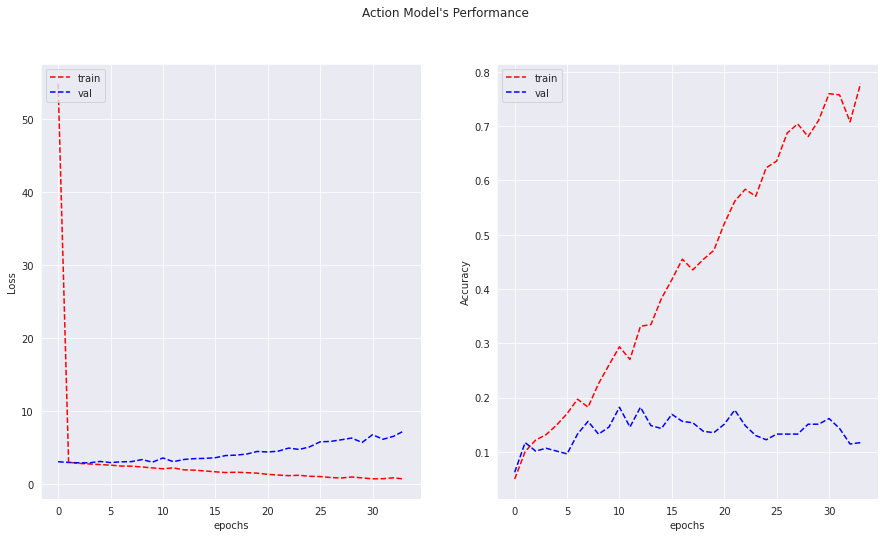

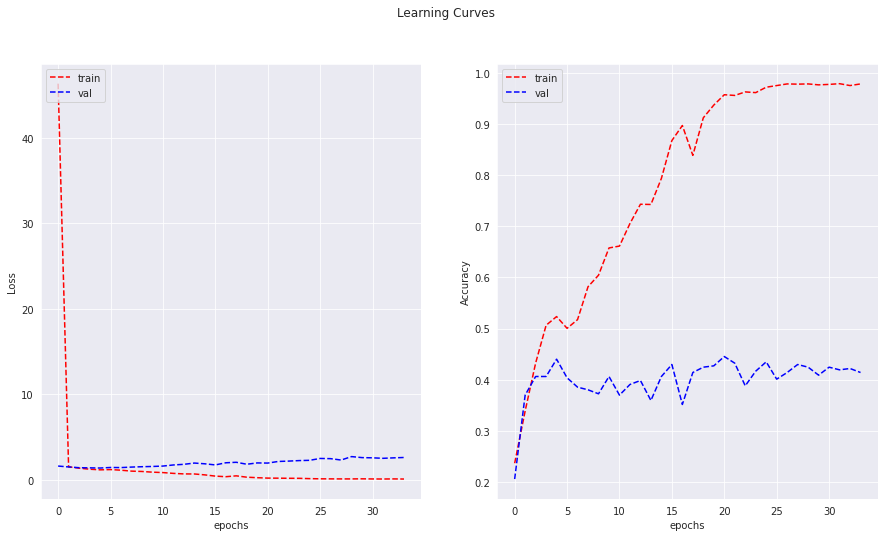

Action Macro F1-score:  0.1100910403498587
Action Class Macro F1-Score :  0.37224128981561233
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.25      0.07      0.11        14
          climbing       0.27      0.16      0.20        25
           cooking       0.07      0.04      0.05        24
cutting_vegetables       0.25      0.27      0.26        11
   feeding_a_horse       0.04      0.04      0.04        23
         gardening       0.00      0.00      0.00        13
           jumping       0.21      0.12      0.15        25
           phoning       0.08      0.16      0.11        19
    playing_guitar       0.08      0.08      0.08        24
    playing_violin       0.20      0.05      0.08        20
     riding_a_bike       0.27      0.24      0.26        25
    riding_a_horse       0.14      0.24      0.17        25
     rowing_a_boat       0.17      0.09      0.12        11
           running       0.17     

In [ ]:
plot_both_curves(model_histories, "Inception_base")
model_result(incep_model,validation_generator)

## InceptionV3 with Data Augmention

In [ ]:
incept_aug = ActionModel(input_shape=IMG_DIM,
                        action_hidden_size_one=1024,
                        action_hidden_size_two=256,
                        action_cls_hidden_size=512,
                         ).assemble_full_model(incep_preprocess, inception, name = "InceptionV3_Aug")

model_histories['Inception_Aug'] = compile_and_fit(incept_aug,
                                            aug_train_generator,
                                            validation_generator,
                                            'models/incep_reg',
                                            ckpt_name='incep_aug_new.ckpt')

Model: "InceptionV3_Aug"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
tf.math.truediv_4 (TFOpLambda)  (None, 224, 224, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
tf.math.subtract_4 (TFOpLambda) (None, 224, 224, 3)  0           tf.math.truediv_4[0][0]          
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    tf.math.subtract_4[0][0]         
                                                                 tf.math.subtract_5[

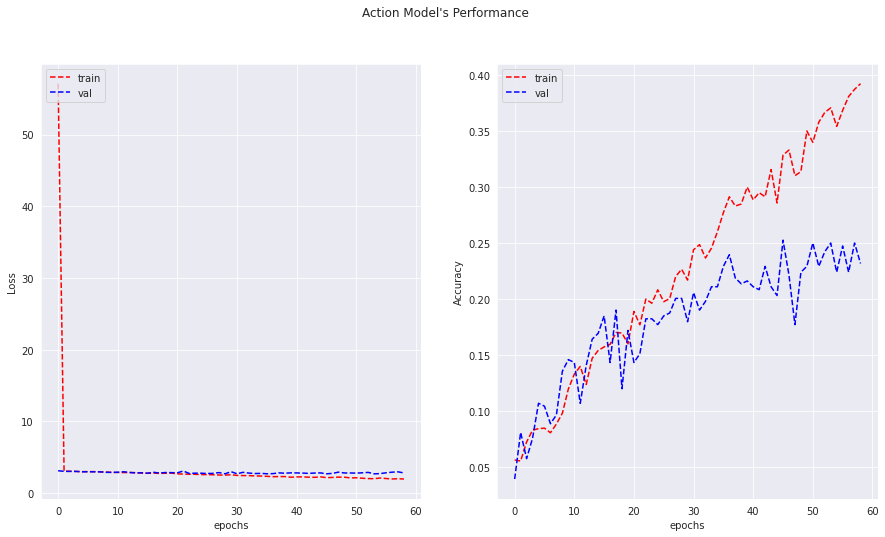

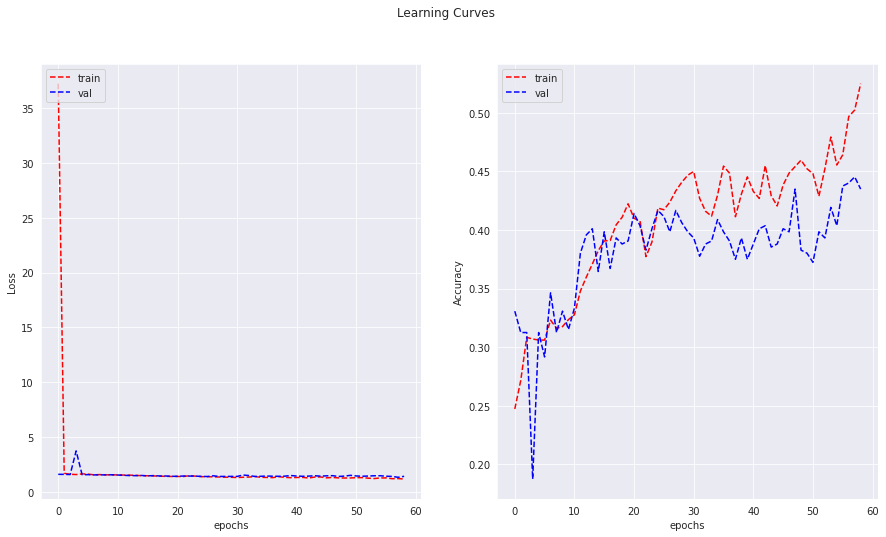

Action Macro F1-score:  0.1938159050365331
Action Class Macro F1-Score :  0.3772872438414546
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.25      0.07      0.11        14
          climbing       0.88      0.28      0.42        25
           cooking       0.15      0.50      0.23        24
cutting_vegetables       0.00      0.00      0.00        11
   feeding_a_horse       0.13      0.17      0.15        23
         gardening       0.07      0.15      0.10        13
           jumping       0.58      0.28      0.38        25
           phoning       0.00      0.00      0.00        19
    playing_guitar       0.67      0.17      0.27        24
    playing_violin       0.35      0.30      0.32        20
     riding_a_bike       0.73      0.32      0.44        25
    riding_a_horse       0.15      0.24      0.19        25
     rowing_a_boat       0.57      0.36      0.44        11
           running       0.21      

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
plot_both_curves(model_histories, "Inception_Aug")
model_result(incept_aug,validation_generator)

In [ ]:
incept_drop = ActionModel(input_shape=IMG_DIM,
                        action_hidden_size_one=1024,
                        action_hidden_size_two=256,
                        action_cls_hidden_size=512,
                        action_cls_dropout = 0.1).assemble_full_model(incep_preprocess, inception,
                                                                        name = "InceptionV3_Drop")
model_histories['Inception_Drop'] = compile_and_fit(incept_drop,
                                            no_aug_train_generator,
                                            validation_generator,
                                            'models/incep_drop',
                                            ckpt_name='incep_drop_1.ckpt')

Model: "InceptionV3_Drop"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
tf.math.truediv_12 (TFOpLambda) (None, 224, 224, 3)  0           input_8[0][0]                    
__________________________________________________________________________________________________
tf.math.subtract_12 (TFOpLambda (None, 224, 224, 3)  0           tf.math.truediv_12[0][0]         
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    tf.math.subtract_12[0][0]        
                                                                 tf.math.subtract_1

### Modeling Class

In [13]:
class ActionClassifier():
  
  def __init__(self, input_shape, action_hidden_size_one,action_hidden_size_two, action_cls_hidden_size, action_dropout = 0.0, action_l2_prop = 0.0, action_cls_dropout = 0.0, action_cls_l2_prop = 0.0, training = False):
    self.input_shape = input_shape
    self.action_hidden_size_one = action_hidden_size_one
    self.action_hidden_size_two = action_hidden_size_two
    self.action_cls_hidden_size = action_cls_hidden_size
    self.action_dropout = action_dropout
    self.action_cls_dropout = action_cls_dropout
    self.action_l2_prop = action_l2_prop
    self.action_cls_l2_prop = action_cls_l2_prop
    self.training = training
  
  def build_action(self, inputs, base_model):
    x = base_model(inputs, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_hidden_size_one, kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_dropout)(x)
    x = Dense(self.action_hidden_size_two, kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_dropout)(x)
    x = Dense(21)(x)
    x = Activation('softmax', name = "action")(x)
    return x

  def build_action_class(self, inputs, base_model):
    x = base_model(inputs, training = self.training)
    x = Flatten()(x)
    x = Dense(self.action_cls_hidden_size,kernel_initializer='he_uniform', kernel_regularizer = tf.keras.regularizers.l2(self.action_cls_l2_prop))(x)
    x = Activation('relu')(x)
    x = Dropout(self.action_cls_dropout)(x)
    x = Dense(5)(x)
    x = Activation('softmax',name = "action_class")(x)
    return x

  def assemble_full_model(self, base_model, name = "Model"):
    """
    Used to assemble our multi-output model CNN.
    """
    input_layer = Input(shape=self.input_shape)
    action_model = self.build_action(input_layer, base_model)
    action_class_model = self.build_action_class(input_layer, base_model)
    model = Model(inputs = input_layer, outputs = [action_model, action_class_model],
                name=name)
    return model

### InceptionV3 without Data Augmentation

In [ ]:
incept_reg = ActionClassifier(input_shape=IMG_DIM,
                        action_hidden_size_one=1024,
                        action_hidden_size_two=256,
                        action_dropout = 0.1,
                        action_cls_hidden_size=512,
                        action_cls_dropout = 0.1).assemble_full_model(inception,
                                                                        name = "InceptionV3_Aug")
model_histories['Inception_Aug'] = compile_and_fit(incept_reg,
                                            no_aug_train_generator,
                                            validation_generator,
                                            'models/incep_reg',
                                            ckpt_name='incep_reg_1.ckpt')

Model: "InceptionV3_Aug"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    input_5[0][0]                    
                                                                 input_5[0][0]                    
__________________________________________________________________________________________________
flatten_6 (Flatten)             (None, 51200)        0           inception_v3[6][0]               
__________________________________________________________________________________________________
dense_15 (Dense)                (None, 1024)         52429824    flatten_6[0][0]    

In [ ]:
incept_reg.save("/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_model")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_model/assets


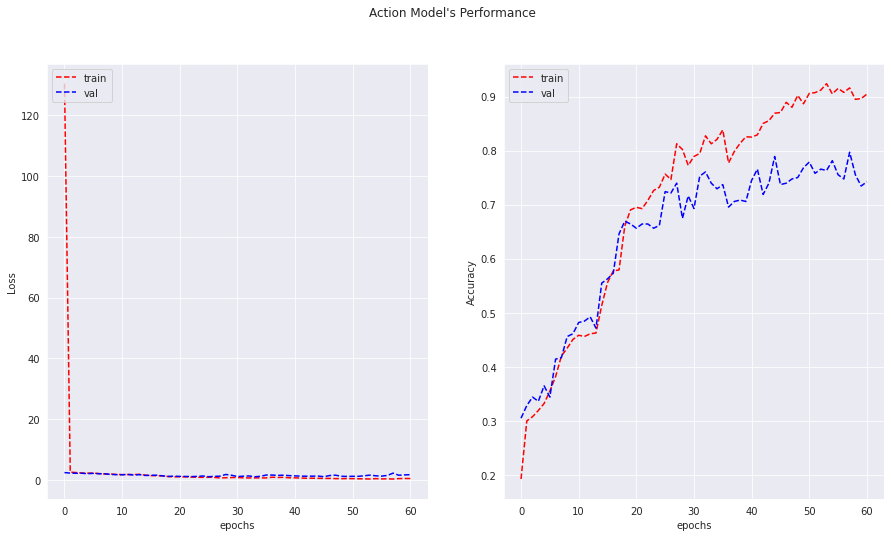

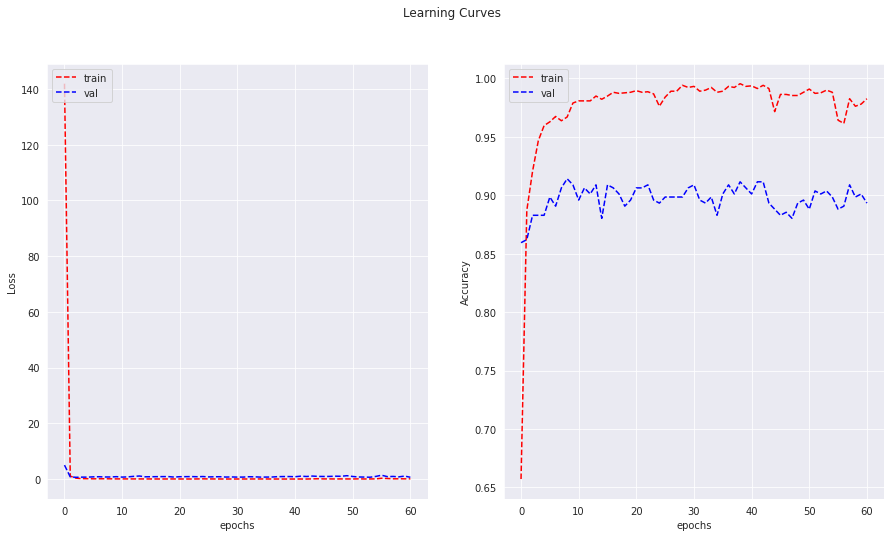

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.85      0.79      0.81        14
          climbing       0.79      0.88      0.83        25
           cooking       0.78      0.58      0.67        24
cutting_vegetables       0.50      0.09      0.15        11
   feeding_a_horse       0.95      0.78      0.86        23
         gardening       0.38      0.46      0.41        13
           jumping       0.53      0.92      0.68        25
           phoning       0.58      0.58      0.58        19
    playing_guitar       1.00      0.96      0.98        24
    playing_violin       1.00      0.90      0.95        20
     riding_a_bike       1.00      0.96      0.98        25
    riding_a_horse       0.74      0.92      0.82        25
     rowing_a_boat       0.83      0.91      0.87        11
           running       0.74      0.74      0.74        19
 shooting_an_arrow       0.79      0.73      0.76        15
     tak

In [ ]:
plot_both_curves(model_histories, "Inception_Aug")
model_result(incept_reg,validation_generator)

### Dropout & Weight Regularizer

In [ ]:
incept_reg_aug = ActionClassifier(input_shape=IMG_DIM,
                        action_hidden_size_one=1024,
                        action_hidden_size_two=256,
                        action_dropout = 0.1,
                        action_cls_hidden_size=512,
                        action_cls_dropout = 0.1,
                        action_cls_l2_prop = 0.001).assemble_full_model(inception,
                                                                        name = "InceptionV3_Aug_reg")
model_histories['Inception_Aug_Reg'] = compile_and_fit(incept_reg_aug,
                                            aug_train_generator,
                                            validation_generator,
                                            'models/incep_reg_aug',
                                            ckpt_name='incep_reg_2.ckpt')

Model: "InceptionV3_Aug_reg"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    input_2[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
flatten (Flatten)               (None, 51200)        0           inception_v3[0][0]               
__________________________________________________________________________________________________
dense (Dense)                   (None, 1024)         52429824    flatten[0][0]  

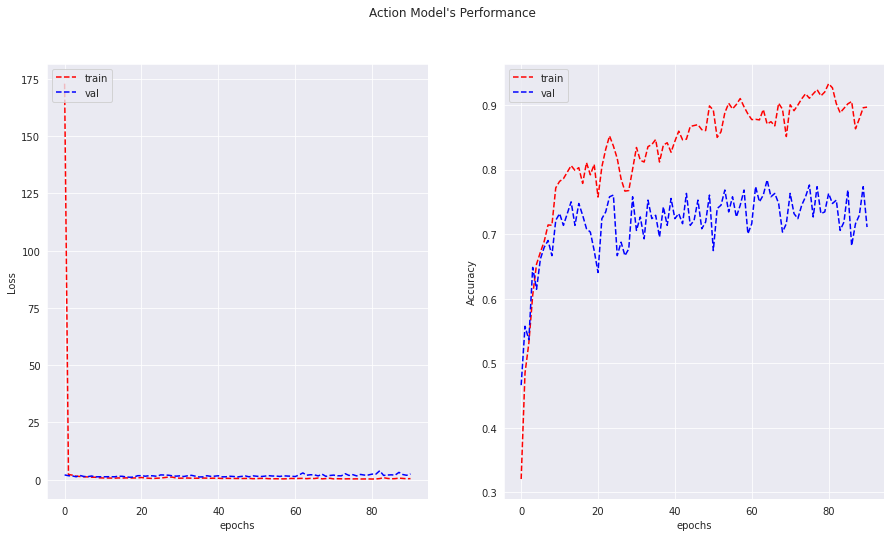

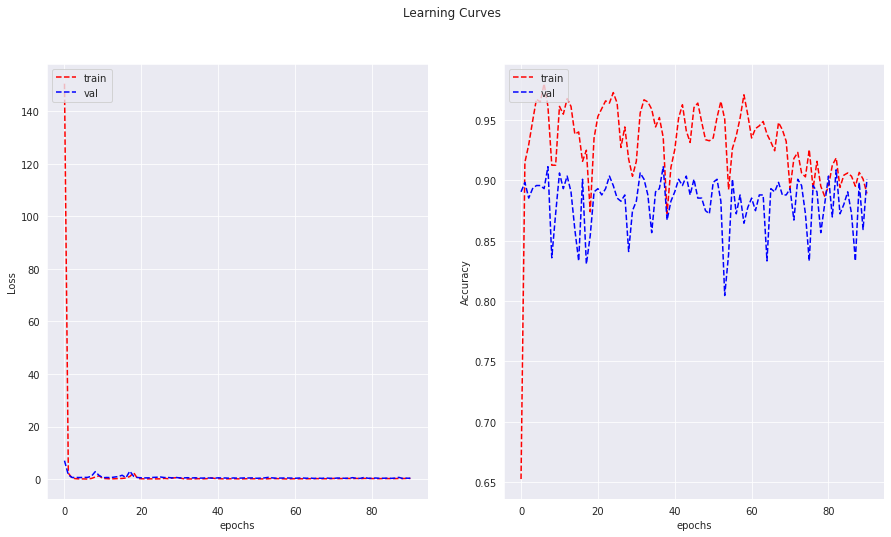

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.80      0.86      0.83        14
          climbing       1.00      0.52      0.68        25
           cooking       0.70      0.67      0.68        24
cutting_vegetables       0.00      0.00      0.00        11
   feeding_a_horse       0.69      0.87      0.77        23
         gardening       0.50      0.38      0.43        13
           jumping       1.00      0.44      0.61        25
           phoning       0.19      0.53      0.27        19
    playing_guitar       1.00      0.96      0.98        24
    playing_violin       0.83      1.00      0.91        20
     riding_a_bike       0.96      1.00      0.98        25
    riding_a_horse       0.77      0.96      0.86        25
     rowing_a_boat       1.00      1.00      1.00        11
           running       0.70      0.74      0.72        19
 shooting_an_arrow       1.00      0.80      0.89        15
     tak

In [ ]:
plot_both_curves(model_histories, "Inception_Aug_Reg")
model_result(incept_reg_aug,validation_generator)

In [ ]:
incept_reg_aug.save("/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_drop_model")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_drop_model/assets


### Further Tuning Dropout, Weight Regularizer

In [ ]:
incept_reg_2 = ActionClassifier(input_shape=IMG_DIM,
                        action_hidden_size_one=1024,
                        action_hidden_size_two=256,
                        action_dropout = 0.1,
                        action_l2_prop = 0.0001,
                        action_cls_hidden_size=512,
                        action_cls_dropout = 0.1,
                        action_cls_l2_prop = 0.0001).assemble_full_model(inception,
                                                                        name = "InceptionV3_Aug_reg2")
model_histories['Inception_Aug_Reg_2'] = compile_and_fit(incept_reg_2,
                                            aug_train_generator,
                                            validation_generator,
                                            'models/incep_reg_aug2',
                                            learning_rate = 0.01,
                                            ckpt_name='incep_reg_3.ckpt')

Model: "InceptionV3_Aug_reg2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    input_3[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 51200)        0           inception_v3[2][0]               
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 1024)         52429824    flatten_2[0][0

Exception ignored in: <function ScopedTFGraph.__del__ at 0x7f73ab678170>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/c_api_util.py", line 58, in __del__
    self.deleter(self.graph)
KeyboardInterrupt


34/34 [==============================] - 49s 1s/step - loss: 360.6273 - action_loss: 162.9469 - action_class_loss: 183.8383 - action_accuracy: 0.2652 - action_class_accuracy: 0.6434 - val_loss: 26.7955 - val_action_loss: 1.9423 - val_action_class_loss: 3.7009 - val_action_accuracy: 0.4245 - val_action_class_accuracy: 0.8724
Epoch 2/100
34/34 [==============================] - 34s 1s/step - loss: 24.4886 - action_loss: 2.3164 - action_class_loss: 1.4293 - action_accuracy: 0.4200 - action_class_accuracy: 0.9177 - val_loss: 22.3672 - val_action_loss: 1.8846 - val_action_class_loss: 0.8777 - val_action_accuracy: 0.4661 - val_action_class_accuracy: 0.8776
Epoch 3/100
34/34 [==============================] - 34s 996ms/step - loss: 20.4689 - action_loss: 1.8002 - action_class_loss: 0.3420 - action_accuracy: 0.4825 - action_class_accuracy: 0.9191 - val_loss: 19.1889 - val_action_loss: 1.6455 - val_action_class_loss: 0.5552 - val_action_accuracy: 0.5026 - val_action_class_accuracy: 0.8984
Epoch

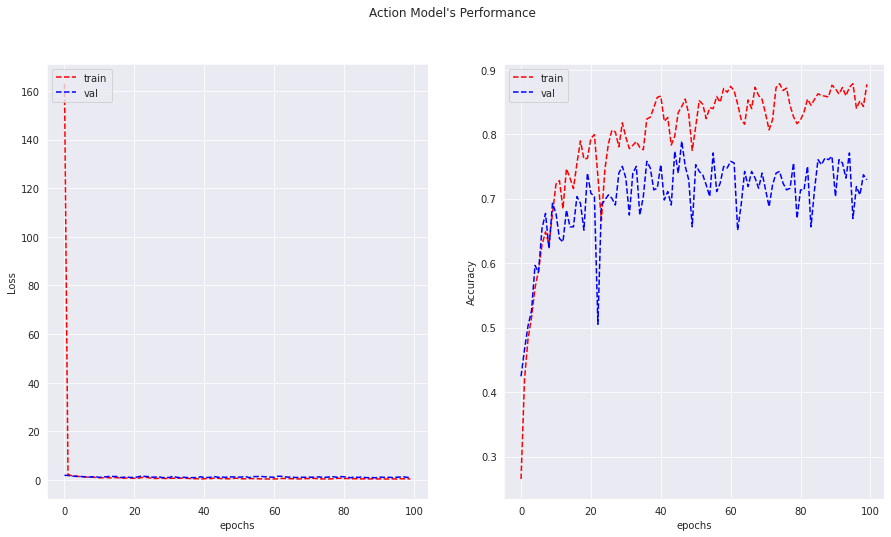

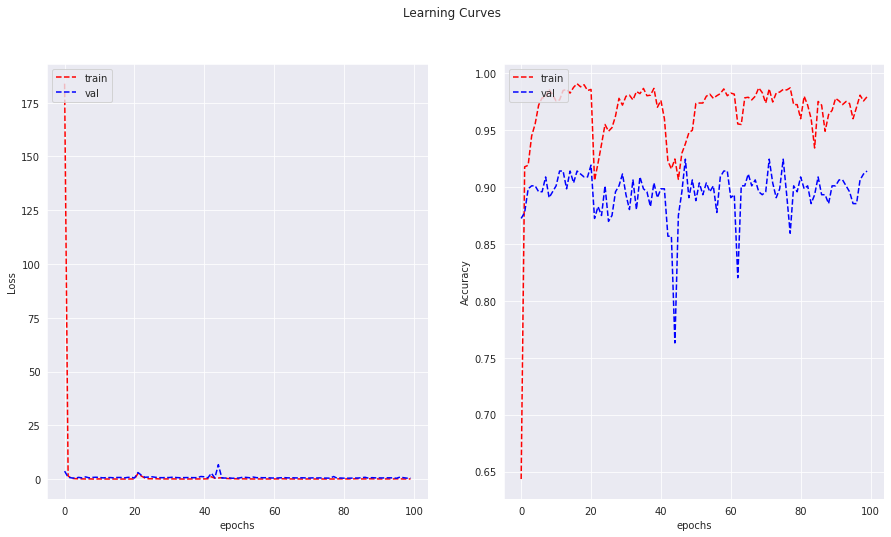

Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.73      0.79      0.76        14
          climbing       1.00      0.68      0.81        25
           cooking       0.70      0.67      0.68        24
cutting_vegetables       0.71      0.45      0.56        11
   feeding_a_horse       0.59      0.83      0.69        23
         gardening       0.86      0.46      0.60        13
           jumping       0.54      0.80      0.65        25
           phoning       0.57      0.63      0.60        19
    playing_guitar       0.92      0.96      0.94        24
    playing_violin       0.83      1.00      0.91        20
     riding_a_bike       0.93      1.00      0.96        25
    riding_a_horse       0.86      0.72      0.78        25
     rowing_a_boat       0.69      1.00      0.81        11
           running       0.59      0.68      0.63        19
 shooting_an_arrow       1.00      0.67      0.80        15
     tak

In [ ]:
plot_both_curves(model_histories, "Inception_Aug_Reg_2")
model_result(incept_reg_2,validation_generator)

In [ ]:
incept_reg_2.save("/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_drop_2_model")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_drop_2_model/assets


## Fine-Tuning InceptionV3 Layers

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_drop_2_model")

In [ ]:
model.trainable = True
print('Number of Inception layers: ', len(model.layers))

num_fine_tune_layers = 200

for layer in model.layers.pop(1).layers[:num_fine_tune_layers]:
  layer.trainable =  False

Number of Inception layers:  17


In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
               loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

model.summary()

history = model.fit(
    no_aug_train_generator,
    batch_size = BATCH_SIZE,
    epochs=10,
    validation_data=validation_generator,
    verbose=1)

Model: "InceptionV3_Aug_reg2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    input_3[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 51200)        0           inception_v3[0][0]               
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 1024)         52429824    flatten_2[0][0

In [ ]:
model_result(model,validation_generator)

Action Macro F1-score:  0.7902786603533705
Action Class Macro F1-Score :  0.9063097308558771
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.71      0.86      0.77        14
          climbing       0.81      0.88      0.85        25
           cooking       0.67      0.83      0.74        24
cutting_vegetables       0.60      0.55      0.57        11
   feeding_a_horse       0.75      0.91      0.82        23
         gardening       0.91      0.77      0.83        13
           jumping       0.71      0.88      0.79        25
           phoning       0.81      0.68      0.74        19
    playing_guitar       1.00      0.96      0.98        24
    playing_violin       0.86      0.95      0.90        20
     riding_a_bike       0.81      1.00      0.89        25
    riding_a_horse       0.91      0.84      0.87        25
     rowing_a_boat       1.00      1.00      1.00        11
           running       0.87      

## Increase Weight Regularizer

In [ ]:
# Increase dropout
#model.get_layer('dense_5').kernel_regularizer = tf.keras.regularizers.l2(0.001)
#model.get_layer('dense_6').kernel_regularizer = tf.keras.regularizers.l2(0.001)
model.get_layer('dense_8').kernel_regularizer = tf.keras.regularizers.l2(0.01)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.000005),
               loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

model.summary()

model_histories['Fine_tuned'] = model.fit(
    aug_train_generator,
    batch_size = BATCH_SIZE,
    epochs=10,
    validation_data=validation_generator,
    verbose=1)

Model: "InceptionV3_Aug_reg2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
inception_v3 (Functional)       (None, 5, 5, 2048)   21802784    input_3[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
flatten_2 (Flatten)             (None, 51200)        0           inception_v3[0][0]               
__________________________________________________________________________________________________
dense_5 (Dense)                 (None, 1024)         52429824    flatten_2[0][0

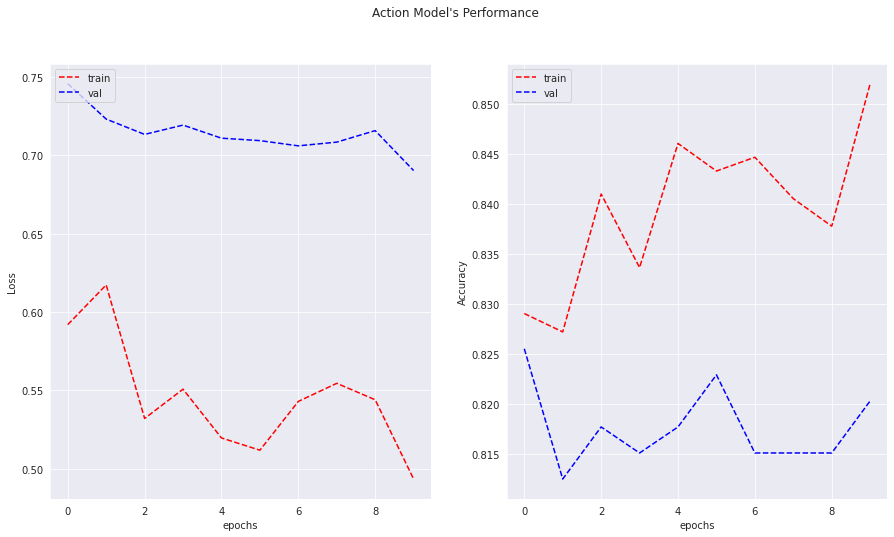

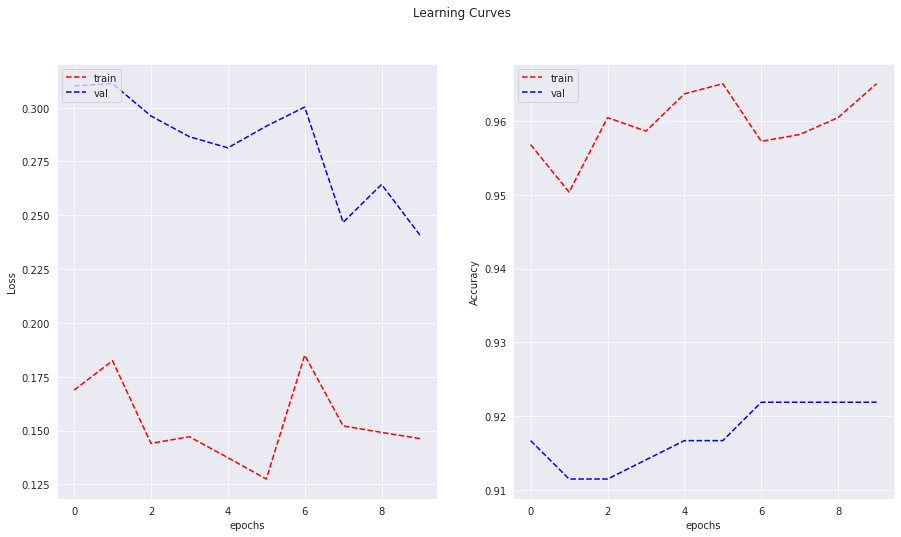

Action Macro F1-score:  0.7989840708692226
Action Class Macro F1-Score :  0.9220211729316274
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.79      0.79      0.79        14
          climbing       0.83      0.96      0.89        25
           cooking       0.65      0.71      0.68        24
cutting_vegetables       0.50      0.55      0.52        11
   feeding_a_horse       0.85      0.96      0.90        23
         gardening       0.91      0.77      0.83        13
           jumping       0.84      0.84      0.84        25
           phoning       0.88      0.74      0.80        19
    playing_guitar       0.96      1.00      0.98        24
    playing_violin       0.95      0.95      0.95        20
     riding_a_bike       0.86      1.00      0.93        25
    riding_a_horse       0.92      0.88      0.90        25
     rowing_a_boat       0.92      1.00      0.96        11
           running       0.52      

In [ ]:
plot_both_curves(model_histories, "Fine_tuned")
model_result(model,validation_generator)

#### Final InceptionV3 Model

In [ ]:
model.save('/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_fine_tuned_final')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_fine_tuned/assets


In [ ]:
def model_cm(model, generator):
  
  action_preds = []
  action_trues = []
  action_cls_preds = []
  action_cls_trues = []
  N_images = len(generator.image_ids)
  
  batches = 0

  # iterate through the data generator and predict for each batch
  # hold the predictions and labels
  
  for x,[y,z] in generator.__iter__():
    action_pred, action_cls_pred = model.predict(x, verbose=0)
    
    action_pred = np.argmax(action_pred, axis = 1)
    action_cls_pred = np.argmax(action_cls_pred, axis = 1)
    # actions
    action_preds = action_preds + action_pred.tolist()
    action_trues = action_trues + y.tolist()
    
    # action class
    action_cls_preds = action_cls_preds + action_cls_pred.tolist()
    action_cls_trues = action_cls_trues + z.tolist()

    batches += 1
    if batches >= N_images / BATCH_SIZE:
        #break the loop
        break
    plot_confusion_matrix(action_trues, action_preds)
    plot_confusion_matrix(action_cls_trues, action_cls_preds)
  # print("Action Macro F1-score: ", metrics.f1_score(action_trues, action_preds,average = "macro"))
  # print("Action Class Macro F1-Score : ", metrics.f1_score(action_cls_trues,action_cls_preds,average= "macro"))
  # print("Action Classification Report \n", metrics.classification_report(action_trues, action_preds, target_names = target_action))
  # print("Action Class Classification Report \n", metrics.classification_report(action_cls_trues, action_cls_preds, target_names = target_action_class))

In [ ]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_test,y_pred):

    conf_data = confusion_matrix(y_test,y_pred)
    df_cm = pd.DataFrame(conf_data, columns=np.unique(y_test), index = np.unique(y_test))
    df_cm.index.name = 'Actual'
    df_cm.columns.name = 'Predicted'
    plt.figure(figsize = (10,7))
    sns.set(font_scale=1.4)#for label size
    return sns.heatmap(df_cm, cmap="Blues",annot=True,square=True,annot_kws={"size": 16},fmt="g");# font size

In [ ]:
# Data Generator
class TestDataLoader(tf.keras.utils.Sequence):
    def __init__(self,
                 df,
                 batch_size=32,
                 dim=(224,224, 3),
                 img_size = (224,224),
                 data_mean=0,
                 data_std=1,
                 data_prefix=''):
        
        'Initialization'
        self.dim = dim  # Dimensions of the input
        self.batch_size = batch_size # Batch size
        self.img_size = img_size # Image size

        # The data is input as a pandas dataframe, we need to read the relevent fields
        self.df = df
        self.image_ids = np.arange(len(self.df.index)).tolist()
        self.data_prefix = data_prefix
        self.indexes = np.arange(len(self.image_ids))
        # Data normalization parameters
        self.data_mean = data_mean
        self.data_std = data_std
        
        #self.on_epoch_end()
        
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.image_ids) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data for the given index'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        # Find list of IDs
        data_ids_temp = [self.image_ids[k] for k in indexes]
        
        # Generate data
        X = self.__data_generation(data_ids_temp)
        
        return X

            
    def __data_generation(self, data_ids_temp):
        'Generates data containing batch_size samples' 

        # Initialization
        X = np.empty((self.batch_size, *self.dim))
        
        # Generate data
        for i, ids in enumerate(data_ids_temp):
            X[i,] = self.__read_data_instance(data_ids_temp[i])
            
        return X


    def __read_data_instance(self, pid):
      # Read an image
      filepath = self.data_prefix + self.df.iloc[pid]['FileName']
      
      data = Image.open(filepath).convert('RGB')
      data = data.resize(self.img_size) # Resize image
      data = np.asarray(data) # Convert into numpy array
      X = data
      # Input normalization
      X = (X - self.data_mean)/self.data_std
      return X

In [ ]:
model = tf.keras.models.load_model("/content/drive/MyDrive/deep_learning_assignment/models/inceptionv3_fine_tuned")

## NASNet Mobile

In [14]:
nasnet_base = tf.keras.applications.NASNetMobile(
    input_shape=IMG_DIM,
    include_top=False,
    weights="imagenet"
)
nasnet_base.trainable = False

20004864/19993432 [==============================] - 0s 0us/step


In [ ]:
# nasnet_preprocess = tf.keras.applications.nasnet.preprocess_input

nasnet_model = ActionClassifier(input_shape=IMG_DIM,
                          action_hidden_size_one = 1024,
                          action_hidden_size_two = 256,
                          action_cls_hidden_size = 512).assemble_full_model(nasnet_base, name = "NasNet")


In [ ]:
model_histories['Nasnet'] = compile_and_fit(nasnet_model,
                                            no_aug_train_generator,
                                            validation_generator,'models/nasnet',
                                            ckpt_name='nasnet.ckpt')

Model: "NasNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_5[0][0]                    
                                                                 input_5[0][0]                    
__________________________________________________________________________________________________
flatten_4 (Flatten)             (None, 51744)        0           NASNet[2][0]                     
__________________________________________________________________________________________________
dense_10 (Dense)                (None, 1024)         52986880    flatten_4[0][0]             

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
34/34 [==============================] - 70s 1s/step - loss: 137.3790 - action_loss: 79.4870 - action_class_loss: 57.8919 - action_accuracy: 0.4637 - action_class_accuracy: 0.7284 - val_loss: 4.7980 - val_action_loss: 2.6036 - val_action_class_loss: 2.1945 - val_action_accuracy: 0.6406 - val_action_class_accuracy: 0.8854
Epoch 2/100
34/34 [==============================] - 33s 953ms/step - loss: 2.8091 - action_loss: 2.0865 - action_class_loss: 0.7226 - action_accuracy: 0.6949 - action_class_accuracy: 0.9384 - val_loss: 2.7941 - val_action_loss: 1.9182 - val_action_class_loss: 0.8759 - val_action_accuracy: 0.6120 - val_action_class_accuracy: 0.8932
Epoch 3/100
34/34 [==============================] - 33s 963ms/step - loss: 1.0343 - action_loss: 0.8954 - action_class_loss: 0.1389 - action_accuracy: 0.7748 - action_class_accuracy: 0.9710 - val_loss: 2.5407 - val_action_loss: 1.8278 - val_action_class_loss: 0.7129 - val_action_accuracy: 0.6771 - val_action_class_accuracy: 0.90

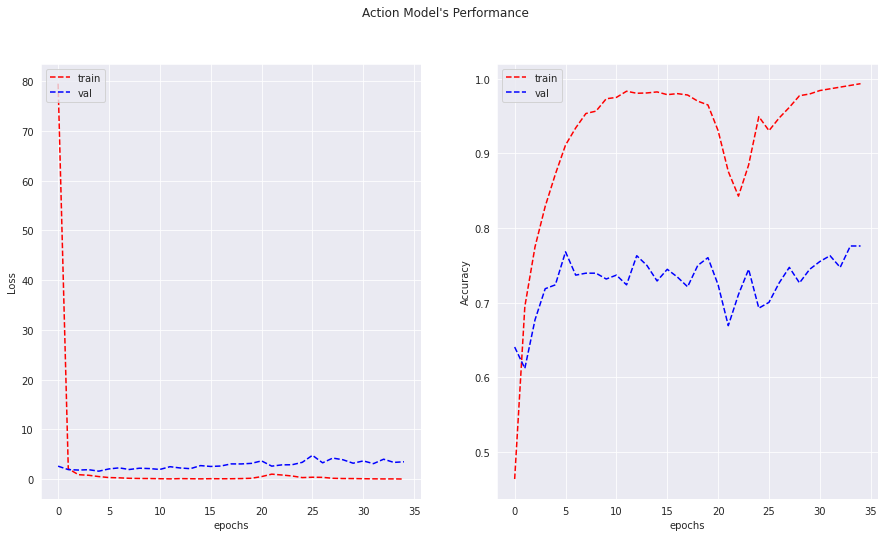

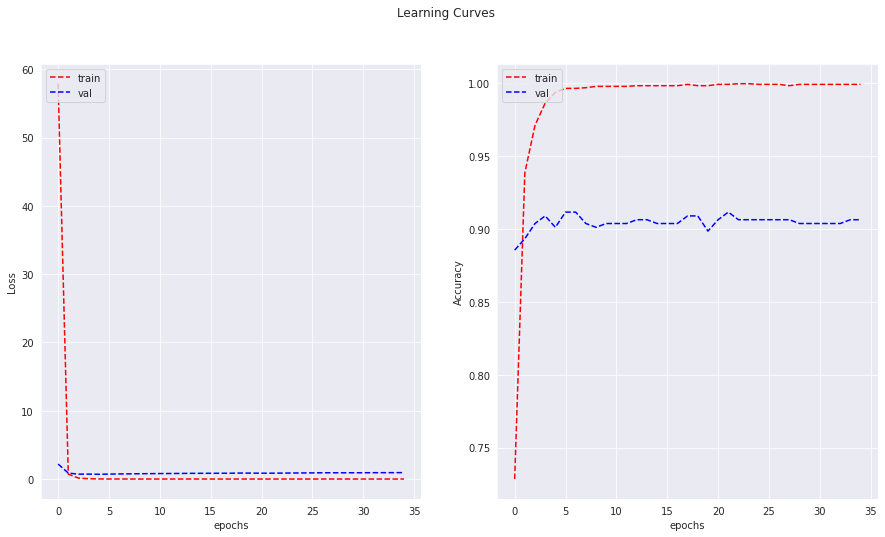

Action Macro F1-score:  0.7487396869096867
Action Class Macro F1-Score :  0.9071802816304995
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       1.00      0.71      0.83        14
          climbing       0.96      0.96      0.96        25
           cooking       0.58      0.75      0.65        24
cutting_vegetables       0.43      0.55      0.48        11
   feeding_a_horse       0.95      0.78      0.86        23
         gardening       0.89      0.62      0.73        13
           jumping       0.71      0.88      0.79        25
           phoning       0.55      0.58      0.56        19
    playing_guitar       0.92      0.96      0.94        24
    playing_violin       0.89      0.80      0.84        20
     riding_a_bike       1.00      1.00      1.00        25
    riding_a_horse       0.88      0.88      0.88        25
     rowing_a_boat       1.00      1.00      1.00        11
           running       0.76      

In [ ]:
plot_both_curves(model_histories,"Nasnet")
model_result(nasnet_model, validation_generator)

## NasNet with Augmentation and Action Class Dropout

In [ ]:
nasnet_aug_model = ActionClassifier(input_shape=IMG_DIM,
                          action_hidden_size_one = 512,
                          action_hidden_size_two = 256,
                          action_cls_dropout = 0.1,
                          action_cls_hidden_size = 512).assemble_full_model(nasnet_base, name = "NasNet_aug")

In [ ]:
model_histories['Nasnet_aug'] = compile_and_fit(nasnet_aug_model, aug_train_generator, validation_generator, 'models/nasnet_aug',ckpt_name='nasnet_augment.ckpt')

Model: "NasNet_aug"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_6[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
flatten_8 (Flatten)             (None, 51744)        0           NASNet[8][0]                     
__________________________________________________________________________________________________
dense_20 (Dense)                (None, 512)          26493440    flatten_8[0][0]         

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
34/34 [==============================] - 120s 3s/step - loss: 154.0801 - action_loss: 96.2892 - action_class_loss: 57.7909 - action_accuracy: 0.2721 - action_class_accuracy: 0.6838 - val_loss: 3.2107 - val_action_loss: 2.0565 - val_action_class_loss: 1.1543 - val_action_accuracy: 0.5286 - val_action_class_accuracy: 0.9115
Epoch 2/100
34/34 [==============================] - 78s 2s/step - loss: 3.0668 - action_loss: 2.0392 - action_class_loss: 1.0276 - action_accuracy: 0.5147 - action_class_accuracy: 0.8102 - val_loss: 1.9848 - val_action_loss: 1.6011 - val_action_class_loss: 0.3837 - val_action_accuracy: 0.5911 - val_action_class_accuracy: 0.8672
Epoch 3/100
34/34 [==============================] - 79s 2s/step - loss: 2.2286 - action_loss: 1.6826 - action_class_loss: 0.5460 - action_accuracy: 0.5519 - action_class_accuracy: 0.8318 - val_loss: 1.5157 - val_action_loss: 1.2235 - val_action_class_loss: 0.2922 - val_action_accuracy: 0.6458 - val_action_class_accuracy: 0.8958
Ep

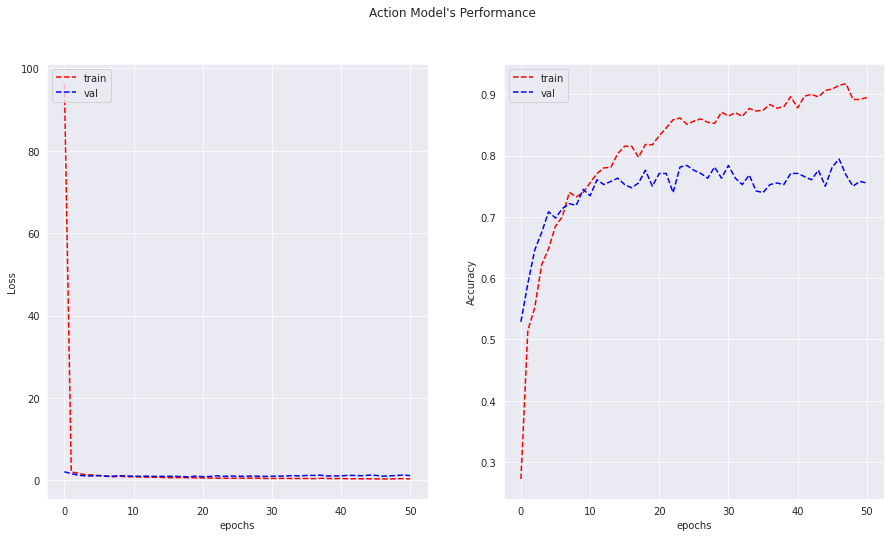

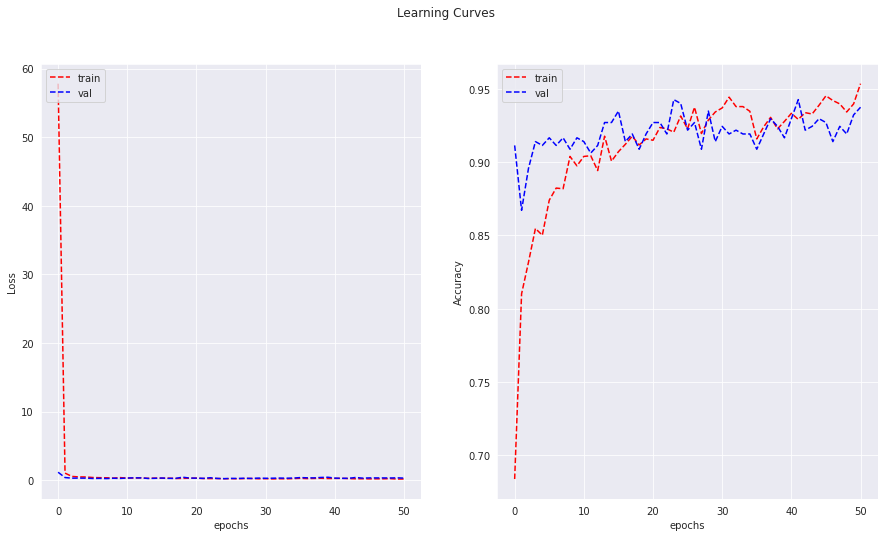

Action Macro F1-score:  0.7143063924920725
Action Class Macro F1-Score :  0.9356664556283218
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.79      0.79      0.79        14
          climbing       0.79      0.92      0.85        25
           cooking       0.68      0.79      0.73        24
cutting_vegetables       0.60      0.27      0.37        11
   feeding_a_horse       0.68      0.91      0.78        23
         gardening       0.41      0.54      0.47        13
           jumping       0.87      0.80      0.83        25
           phoning       0.55      0.58      0.56        19
    playing_guitar       0.92      0.92      0.92        24
    playing_violin       0.89      0.85      0.87        20
     riding_a_bike       1.00      0.88      0.94        25
    riding_a_horse       0.88      0.92      0.90        25
     rowing_a_boat       1.00      1.00      1.00        11
           running       0.85      

In [ ]:
plot_both_curves(model_histories,"Nasnet_aug")
model_result(nasnet_aug_model, validation_generator)

In [15]:
nasnet_drop_model = ActionClassifier(input_shape=IMG_DIM,
                          action_hidden_size_one = 512,
                          action_hidden_size_two = 256,
                          action_dropout = 0.1,
                          action_cls_hidden_size = 512,
                           action_cls_l2_prop = 0.001).assemble_full_model(nasnet_base, name = "NasNet_Drop")

In [17]:
checkpoint_dir = CHECKPOINT_DIR + 'nasnet_aug_drop.ckpt'

nasnet_drop_model.load_weights(checkpoint_dir)
model_histories['Nasnet_drop'] = compile_and_fit(nasnet_drop_model,
                                                 aug_train_generator,
                                                 validation_generator,
                                                 'models/nasnet_drop',ckpt_name='nasnet_aug_drop_5.ckpt')

Model: "NasNet_Drop"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_2[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
flatten (Flatten)               (None, 51744)        0           NASNet[0][0]                     
__________________________________________________________________________________________________
dense (Dense)                   (None, 512)          26493440    flatten[0][0]          

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/100
34/34 [==============================] - 537s 14s/step - loss: 2.5789 - action_loss: 1.2892 - action_class_loss: 0.3557 - action_accuracy: 0.6498 - action_class_accuracy: 0.8948 - val_loss: 2.6177 - val_action_loss: 1.1703 - val_action_class_loss: 0.3369 - val_action_accuracy: 0.6927 - val_action_class_accuracy: 0.9141
Epoch 2/100
34/34 [==============================] - 80s 2s/step - loss: 2.5976 - action_loss: 1.3155 - action_class_loss: 0.3106 - action_accuracy: 0.6301 - action_class_accuracy: 0.9007 - val_loss: 2.3528 - val_action_loss: 1.2035 - val_action_class_loss: 0.3068 - val_action_accuracy: 0.6953 - val_action_class_accuracy: 0.9089
Epoch 3/100
34/34 [==============================] - 77s 2s/step - loss: 2.3475 - action_loss: 1.2897 - action_class_loss: 0.2873 - action_accuracy: 0.6255 - action_class_accuracy: 0.9131 - val_loss: 2.1149 - val_action_loss: 1.1002 - val_action_class_loss: 0.2444 - val_action_accuracy: 0.6875 - val_action_class_accuracy: 0.9219
Epoch

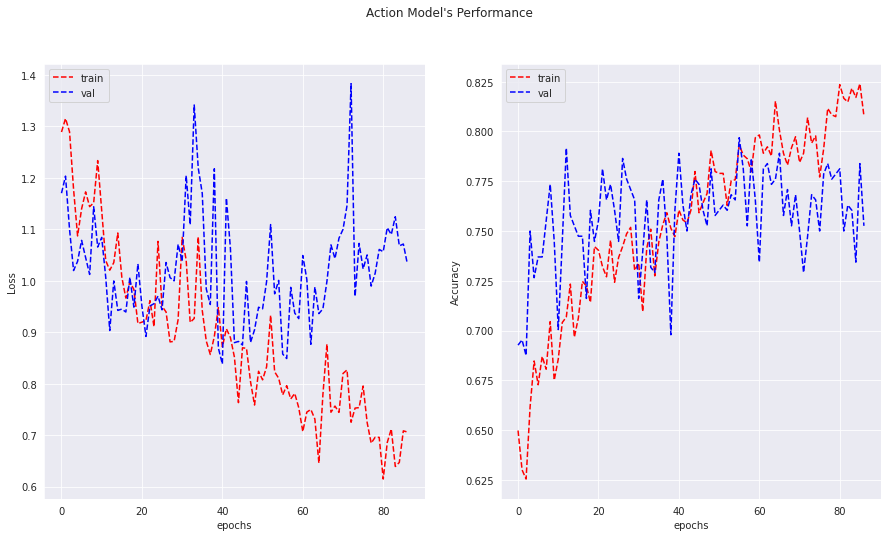

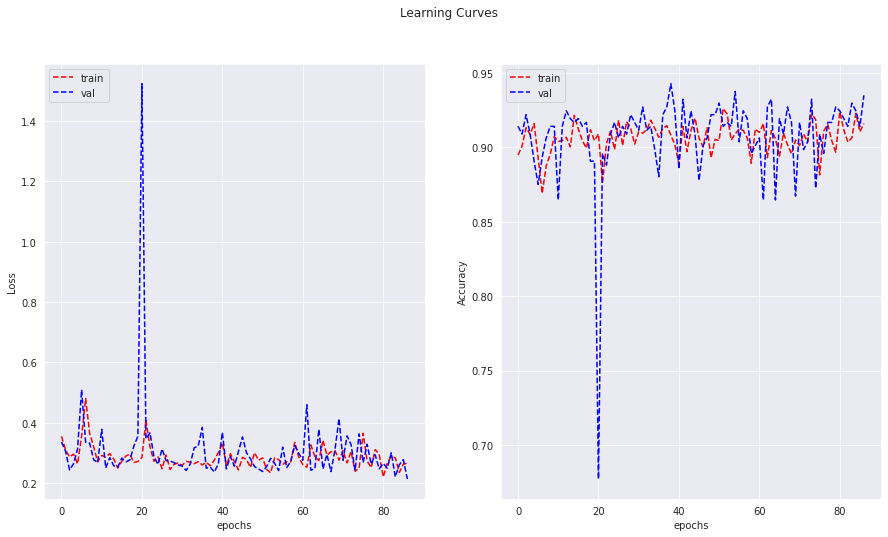

Action Macro F1-score:  0.7266115740747777
Action Class Macro F1-Score :  0.932949669146997
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       1.00      0.50      0.67        14
          climbing       0.95      0.84      0.89        25
           cooking       0.62      0.75      0.68        24
cutting_vegetables       0.43      0.27      0.33        11
   feeding_a_horse       0.95      0.78      0.86        23
         gardening       0.91      0.77      0.83        13
           jumping       0.78      0.72      0.75        25
           phoning       0.61      0.74      0.67        19
    playing_guitar       0.88      0.96      0.92        24
    playing_violin       0.84      0.80      0.82        20
     riding_a_bike       1.00      1.00      1.00        25
    riding_a_horse       0.85      0.88      0.86        25
     rowing_a_boat       1.00      0.91      0.95        11
           running       0.41      0

In [18]:
plot_both_curves(model_histories,"Nasnet_drop")
model_result(nasnet_drop_model, validation_generator)

In [27]:
nasnet_regs_model = ActionClassifier(input_shape=IMG_DIM,
                          action_hidden_size_one = 512,
                          action_hidden_size_two = 256,
                          action_l2_prop = 0.0002,
                          action_cls_hidden_size = 512,
                          action_cls_l2_prop = 0.0002).assemble_full_model(nasnet_base, name = "NasNet_Reg")

In [28]:
model_histories['Nasnet_reg'] = compile_and_fit(nasnet_regs_model,
                                                 aug_train_generator,
                                                 validation_generator,
                                                 'models/nasnet_reg',
                                                learning_rate = 0.001,max_epochs = 50, ckpt_name='nasnet_aug_reg_3.ckpt')

Model: "NasNet_Reg"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_7[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
flatten_10 (Flatten)            (None, 51744)        0           NASNet[10][0]                    
__________________________________________________________________________________________________
dense_25 (Dense)                (None, 512)          26493440    flatten_10[0][0]        

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
34/34 [==============================] - 147s 3s/step - loss: 159.2025 - action_loss: 84.8333 - action_class_loss: 59.3387 - action_accuracy: 0.3093 - action_class_accuracy: 0.6930 - val_loss: 25.5394 - val_action_loss: 2.0087 - val_action_class_loss: 2.2691 - val_action_accuracy: 0.5182 - val_action_class_accuracy: 0.8620
Epoch 2/50
34/34 [==============================] - 84s 2s/step - loss: 22.5675 - action_loss: 1.8483 - action_class_loss: 1.3942 - action_accuracy: 0.5188 - action_class_accuracy: 0.8364 - val_loss: 18.8159 - val_action_loss: 1.4498 - val_action_class_loss: 0.5051 - val_action_accuracy: 0.5911 - val_action_class_accuracy: 0.9089
Epoch 3/50
34/34 [==============================] - 83s 2s/step - loss: 16.8407 - action_loss: 1.4117 - action_class_loss: 0.5974 - action_accuracy: 0.6080 - action_class_accuracy: 0.8341 - val_loss: 14.6760 - val_action_loss: 1.3237 - val_action_class_loss: 0.3959 - val_action_accuracy: 0.6562 - val_action_class_accuracy: 0.8750


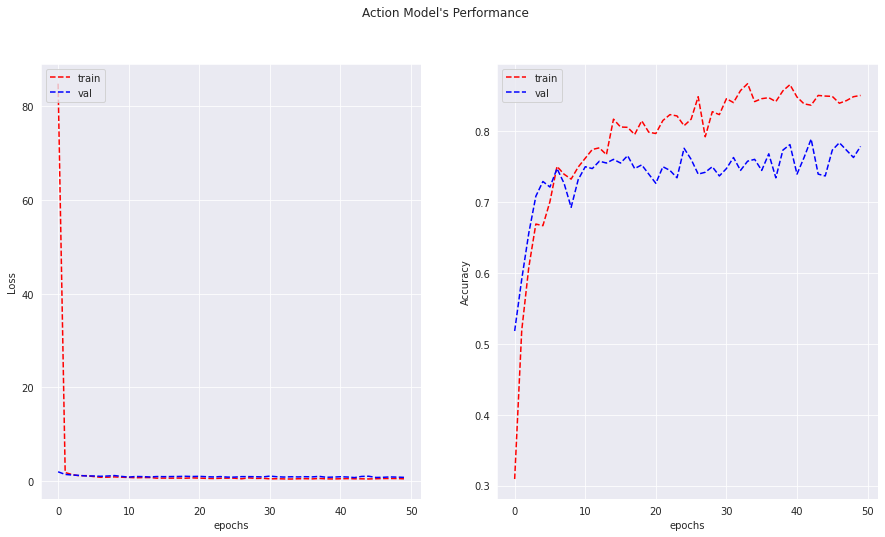

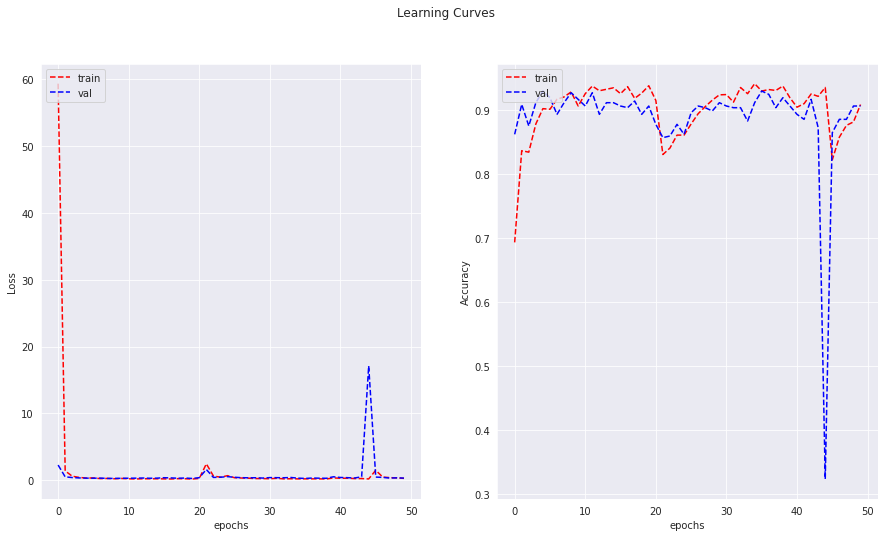

Action Macro F1-score:  0.7327059854362664
Action Class Macro F1-Score :  0.906883673774465
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.83      0.71      0.77        14
          climbing       0.92      0.96      0.94        25
           cooking       0.66      0.88      0.75        24
cutting_vegetables       0.55      0.55      0.55        11
   feeding_a_horse       0.86      0.83      0.84        23
         gardening       0.69      0.69      0.69        13
           jumping       0.72      0.92      0.81        25
           phoning       0.54      0.68      0.60        19
    playing_guitar       1.00      0.96      0.98        24
    playing_violin       0.80      1.00      0.89        20
     riding_a_bike       0.96      0.92      0.94        25
    riding_a_horse       0.88      0.84      0.86        25
     rowing_a_boat       1.00      0.91      0.95        11
           running       0.72      0

In [29]:
plot_both_curves(model_histories,"Nasnet_reg")
model_result(nasnet_regs_model, validation_generator)

In [30]:
nasnet_regs_model.save(DATA_DIR + 'nasnet_reg_final_model')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/deep_learning_assignment/A1_data/nasnet_reg_final_model/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [33]:
nasnet_regs_model.trainable = True

print('Number of Nasnet layers: ', len(nasnet_regs_model.layers.pop(1).layers))

num_fine_tune_layers = 400

for layer in nasnet_regs_model.layers.pop(1).layers[:num_fine_tune_layers]:
  layer.trainable =  False

Number of Nasnet layers:  769


In [34]:
nasnet_regs_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.000005),
               loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

nasnet_regs_model.summary()

model_histories['Fine_tuned'] = nasnet_regs_model.fit(
    aug_train_generator,
    batch_size = BATCH_SIZE,
    epochs=10,
    validation_data=validation_generator,
    verbose=1)

Model: "NasNet_Reg"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_7[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
flatten_10 (Flatten)            (None, 51744)        0           NASNet[10][0]                    
__________________________________________________________________________________________________
dense_25 (Dense)                (None, 512)          26493440    flatten_10[0][0]        

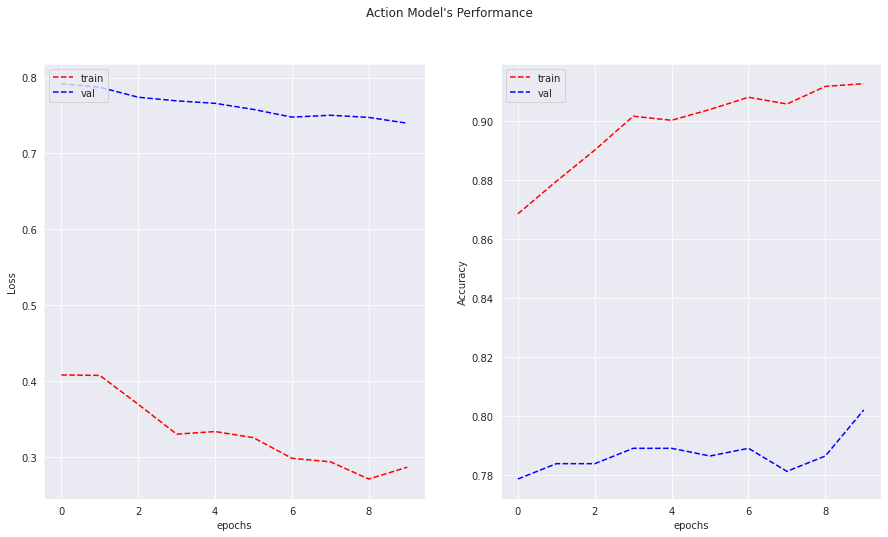

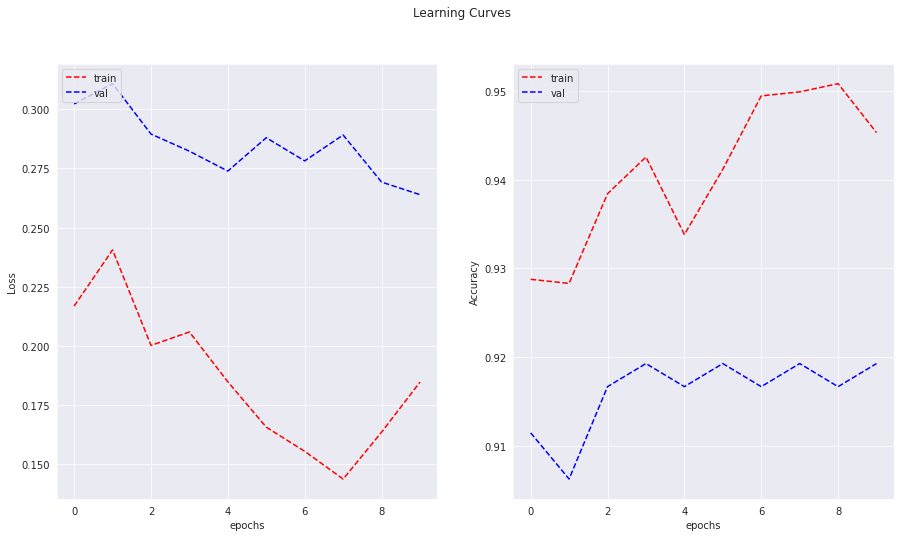

Action Macro F1-score:  0.7565910258000889
Action Class Macro F1-Score :  0.9201641601531309
Action Classification Report 
                     precision    recall  f1-score   support

cleaning_the_floor       0.91      0.71      0.80        14
          climbing       1.00      0.96      0.98        25
           cooking       0.79      0.92      0.85        24
cutting_vegetables       0.53      0.82      0.64        11
   feeding_a_horse       0.91      0.87      0.89        23
         gardening       0.82      0.69      0.75        13
           jumping       0.81      0.84      0.82        25
           phoning       0.50      0.47      0.49        19
    playing_guitar       0.92      1.00      0.96        24
    playing_violin       0.90      0.90      0.90        20
     riding_a_bike       0.96      0.96      0.96        25
    riding_a_horse       0.88      0.88      0.88        25
     rowing_a_boat       0.77      0.91      0.83        11
           running       0.75      

In [36]:
plot_both_curves(model_histories,"Fine_tuned")
model_result(nasnet_regs_model, validation_generator)

In [ ]:
nasnet_regs_model.get_layer('dense_25').kernel_regularizer = tf.keras.regularizers.l2(0.001)

nasnet_regs_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.000002),
               loss = {'action':'sparse_categorical_crossentropy',
                    'action_class':'sparse_categorical_crossentropy'},
              metrics={'action':'accuracy',
                       'action_class':'accuracy'})

nasnet_regs_model.summary()

model_histories['Fine_tuned'] = nasnet_regs_model.fit(
    aug_train_generator,
    batch_size = BATCH_SIZE,
    epochs=10,
    validation_data=validation_generator,
    verbose=1)

Model: "NasNet_Reg"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
NASNet (Functional)             (None, 7, 7, 1056)   4269716     input_7[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
flatten_10 (Flatten)            (None, 51744)        0           NASNet[10][0]                    
__________________________________________________________________________________________________
dense_25 (Dense)                (None, 512)          26493440    flatten_10[0][0]        